In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
# !unzip -q '/content/drive/MyDrive/flowers/flowers.zip' -d '/content/flowers'

In [3]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import os
import torchvision
import torchvision.transforms as tt
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
from tqdm import tqdm
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
import random
import torch.nn.functional as F

In [12]:
class Arguments():
  def __init__(self, epochs = 128, batch_size = 16, image_size = 64, data_path = '', device = 'cuda', lr = 0.0002, num_samples = 4):
    self.epochs = epochs
    self.batch_size = batch_size
    self.image_size = image_size
    self.data_path = data_path
    self.device = device
    self.lr = lr
    self.num_samples = num_samples

args = Arguments()
args.epochs = 64
args.batch_size = 12
args.image_size = 64
args.dataset_path = "/content/flowers"
args.device = "cuda" if torch.cuda.is_available() else 'cpu'
args.lr = 0.0002
args.num_samples = 4    #EVEN

print(args.device)

cuda


In [23]:
class Diffusion():
  def __init__(self, time_steps = 500, beta_start = 0.0001, beta_stop = 0.02, image_size = 64, device = 'cuda'):
    self.time_steps = time_steps
    self.beta_start = beta_start
    self.beta_stop = beta_stop
    self.img_size = image_size
    self.device = device

    self.beta = self.beta_schedule()
    self.beta = self.beta.to(device)
    self.alpha = 1 - self.beta
    self.alpha = self.alpha.to(device)
    self.alpha_hat = torch.cumprod(self.alpha, dim = 0).to(device)


  def beta_schedule(self):
    return torch.linspace(self.beta_start, self.beta_stop, self.time_steps)

  def noise_images(self, images, t):
    sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None,]
    sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None,]
    noises = torch.randn_like(images)
    noised_images = sqrt_alpha_hat * images + sqrt_one_minus_alpha_hat * noises
    return noised_images, noises

  def random_timesteps(self, n):
    return torch.randint(low=1, high=self.time_steps, size=(n,))

  def show_images(self, images):
    images = (images.clamp(-1, 1) + 1) / 2
    samples = images.size()[0]
    if samples == 1:
        rows, cols = 1, 1
    else:
        rows, cols = int(samples/2), 2
    images = (images * 255).type(torch.uint8)
    j = 1
    for i in images:
      plt.subplot(rows, cols, j)
      plt.imshow(i.permute(1, 2, 0).cpu().detach().numpy())
      j += 1
    plt.show()

  def generate_samples(self, model, text, n, show = True):
    with torch.no_grad():
            x = torch.randn((n, 3, self.img_size, self.img_size)).to(self.device)
            for i in tqdm(reversed(range(1, self.time_steps)), position=0):
                t = (torch.ones(n) * i).long().to(self.device)
                predicted_noise = model(x, t, text)
                alpha = self.alpha[t][:, None, None, None]
                alpha_hat = self.alpha_hat[t][:, None, None, None]
                beta = self.beta[t][:, None, None, None]
                if i > 1:
                    noise = torch.randn_like(x)
                else:
                    noise = torch.zeros_like(x)
                x = 1 / torch.sqrt(alpha) * (x - ((1 - alpha) / (torch.sqrt(1 - alpha_hat))) * predicted_noise) + torch.sqrt(beta) * noise

    if show:
      self.show_images(x)
    return x
      #show_images

In [6]:
sentence_model = SentenceTransformer('all-MiniLM-L6-v2')

In [7]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, residual=False):
        super().__init__()
        self.residual = residual
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, mid_channels),
            nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, out_channels),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.double_conv(x))
        else:
            return self.double_conv(x)

class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb

class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()

        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = nn.Sequential(
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels, in_channels // 2),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb

class UNet(nn.Module):
    def __init__(self, c_in=3, c_out=3, time_dim=256, device="cuda", sentence_model = sentence_model):
        super().__init__()
        self.device = device
        self.time_dim = time_dim

        self.inc = DoubleConv(c_in, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 256)

        self.bot1 = DoubleConv(256, 512)
        self.bot2 = DoubleConv(512, 512)
        self.bot3 = DoubleConv(512, 256)

        self.up1 = Up(512, 128)
        self.up2 = Up(256, 64)
        self.up3 = Up(128, 64)
        self.outc = nn.Conv2d(64, c_out, kernel_size=1)
        self.sentence_model = sentence_model
        
        self.text_enc = nn.Sequential(nn.Linear(384, 500), 
                                      nn.Linear(500, time_dim))

    def positional_encoding(self, t, channels):
        inv_freq = 1.0 / (
            10000
            ** (torch.arange(0, channels, 2, device=self.device).float() / channels)
        )
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc
        

    def forward(self, image, t, text):
        t = t.unsqueeze(-1).type(torch.float)
        t = self.positional_encoding(t, self.time_dim)
        
        sentence_embeddings = self.sentence_model.encode(text, convert_to_tensor=True)
        sentence_embeddings = sentence_embeddings.to(self.device)
        text_enc = self.text_enc(sentence_embeddings)  
        
        t = t + text_enc

        x1 = self.inc(image)
        x2 = self.down1(x1, t)
        x3 = self.down2(x2, t)
        x4 = self.down3(x3, t)

        x4 = self.bot1(x4)
        # x4 = self.bot2(x4)
        x4 = self.bot3(x4)

        x = self.up1(x4, x3, t)
        x = self.up2(x, x2, t)
        x = self.up3(x, x1, t)
        output = self.outc(x)
#         output = F.relu(output)
        return output

model = UNet(device = args.device).to(args.device)

In [35]:
try:
    model.load_state_dict(torch.load('conditional_diffusion_64.pth'))
    model.to(args.device)
    print("Loaded Model Successfully")
except:
    print("No saved Model state found")

Loaded Model Successfully


In [9]:
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

image_transform = tt.Compose([ tt.Resize(args.image_size), tt.CenterCrop(args.image_size), tt.ToTensor(), tt.Normalize(*stats)])

class FlowerDescDataset(Dataset):
    def __init__(self, df2, transform = image_transform):
        self.desc_df = df2
        self.transform=transform
    
    def __len__(self):
        return self.desc_df.ngroups
    
    def __getitem__(self,index):
        img_name = list(self.desc_df.groups.keys())[index]
        img_path = 'jpg/flowers/' + img_name
        img = Image.open(img_path)
        image = self.transform(img)

        descriptions = self.desc_df.get_group(img_name)
        matching_text = descriptions.iloc[random.randint(0, len(descriptions)-1), 2]
        
        return image, matching_text

df = pd.read_csv('image_desc.csv')
df2 = df.groupby('Image Name')

dataset = FlowerDescDataset(df2)
print(len(dataset))
dl = DataLoader(dataset, batch_size=args.batch_size, shuffle=True, drop_last = True)

8189


In [16]:
def train(args):
    device = args.device
    optimizer = torch.optim.AdamW(model.parameters(), lr=args.lr)
    mse = nn.MSELoss()
    diffusion = Diffusion(image_size=args.image_size, device=device)
    l = len(dl)
    print(l)

    for epoch in range(args.epochs):
        losses = []
        for images, text in tqdm(dl):
            images = images.to(device)
            t = diffusion.random_timesteps(images.shape[0]).to(device)
            x_t, noise = diffusion.noise_images(images, t)

            predicted_noise = model(image = x_t, t = t, text = text)
            loss = mse(noise, predicted_noise)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            losses.append(loss.item())
            
        sample_text = ["red flower with purple sepals", 
                       "pink flower with yellow petals", 
                       "yellow long petals with red centre", 
                       "red flower with pink petals"]
        sampled_images = diffusion.generate_samples(model, sample_text, n = len(sample_text))
        avg_loss = sum(losses) / len(losses)
        print("EPOCH =", epoch + 1, "/", args.epochs, "LOSS = :", avg_loss)

682


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:14<00:00,  5.09it/s]
499it [00:19, 25.27it/s]


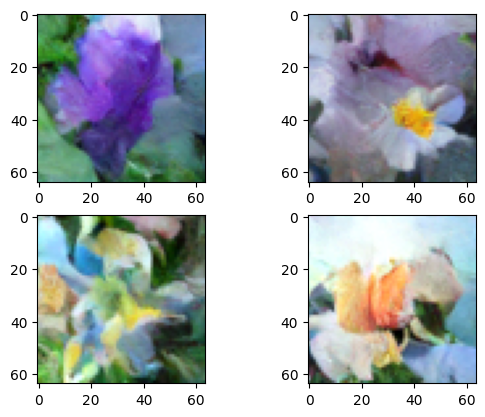

EPOCH = 1 / 64 LOSS = : 0.0410566304337856


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:16<00:00,  5.00it/s]
499it [00:20, 24.14it/s]


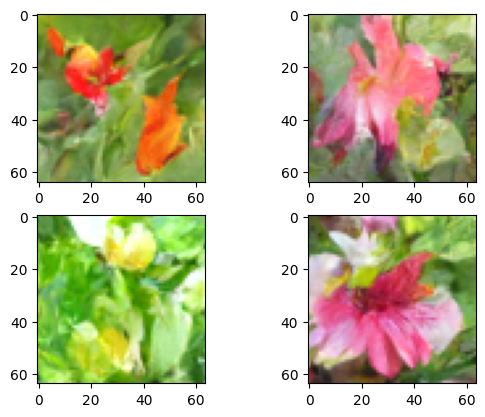

EPOCH = 2 / 64 LOSS = : 0.04037223490162635


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:18<00:00,  4.92it/s]
499it [00:21, 23.62it/s]


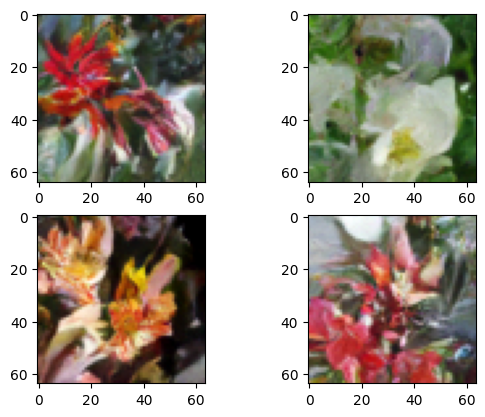

EPOCH = 3 / 64 LOSS = : 0.04096025804090491


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:18<00:00,  4.91it/s]
499it [00:21, 23.38it/s]


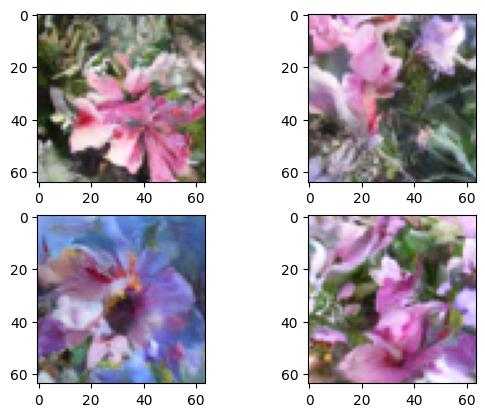

EPOCH = 4 / 64 LOSS = : 0.04088345346999658


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.56it/s]


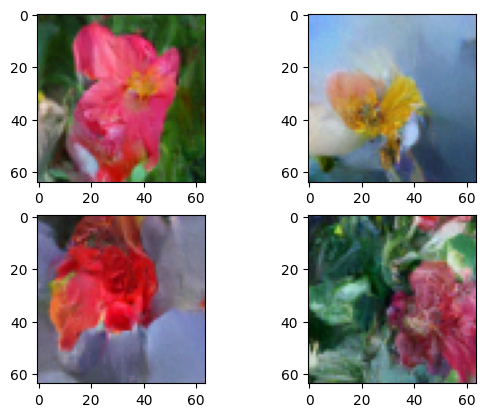

EPOCH = 5 / 64 LOSS = : 0.04135271518824409


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.74it/s]


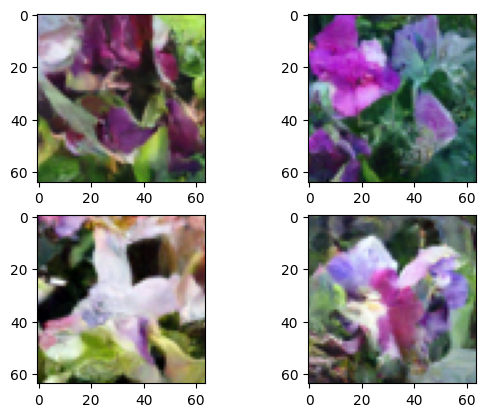

EPOCH = 6 / 64 LOSS = : 0.041622465536479025


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.76it/s]


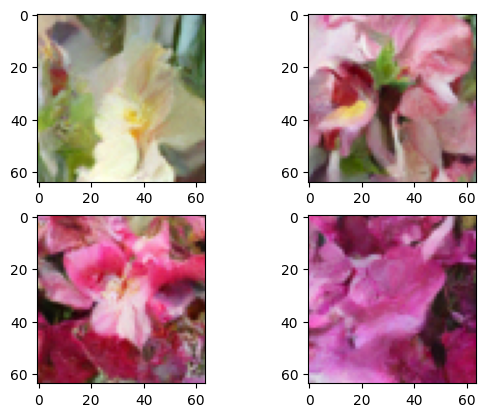

EPOCH = 7 / 64 LOSS = : 0.04046205040804845


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.87it/s]
499it [00:21, 23.36it/s]


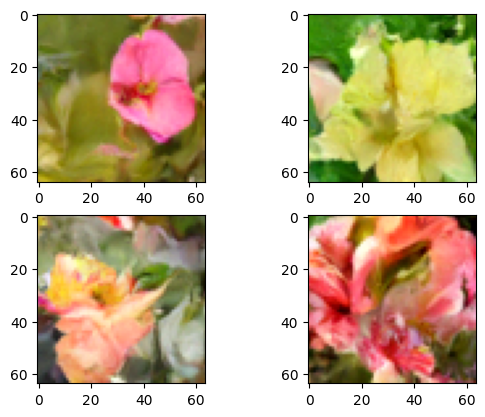

EPOCH = 8 / 64 LOSS = : 0.04047892591233237


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.88it/s]
499it [00:21, 23.58it/s]


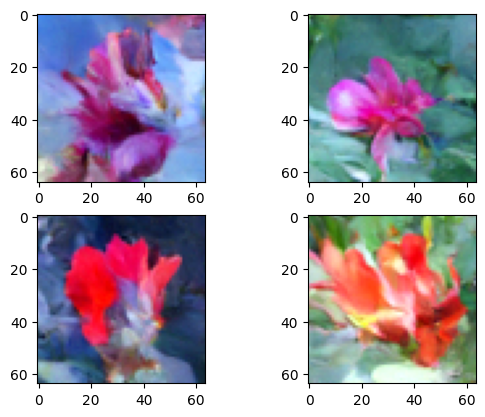

EPOCH = 9 / 64 LOSS = : 0.04033997207347446


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.88it/s]
499it [00:21, 23.35it/s]


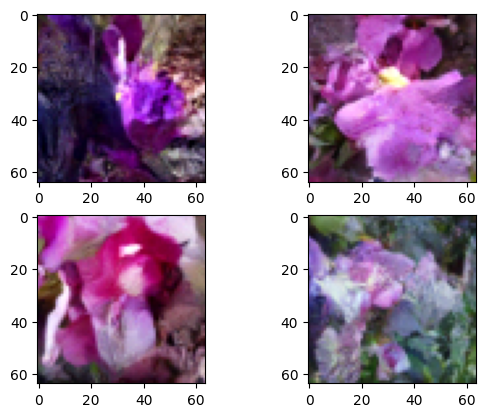

EPOCH = 10 / 64 LOSS = : 0.041916411197976455


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.66it/s]


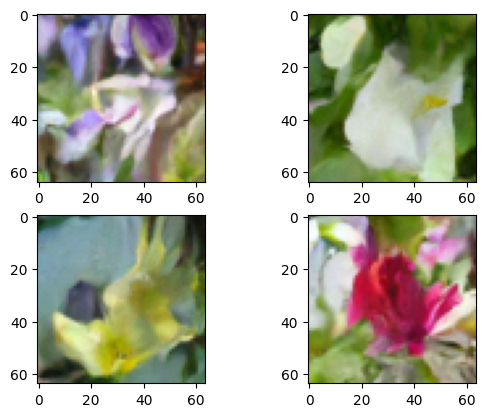

EPOCH = 11 / 64 LOSS = : 0.04072038230316883


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.54it/s]


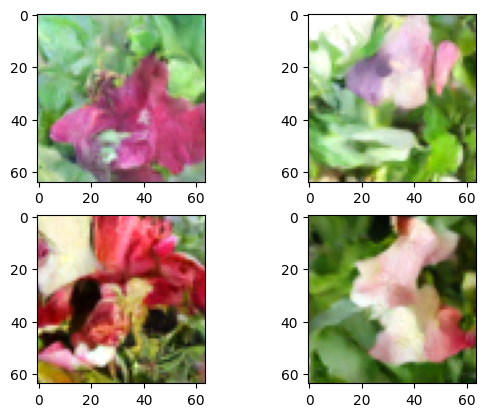

EPOCH = 12 / 64 LOSS = : 0.03929520504347041


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.87it/s]
499it [00:21, 23.54it/s]


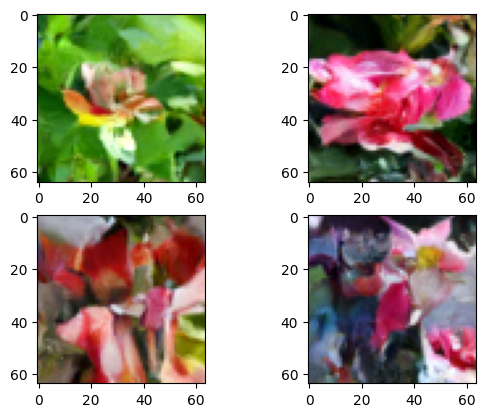

EPOCH = 13 / 64 LOSS = : 0.042419185149797464


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.62it/s]


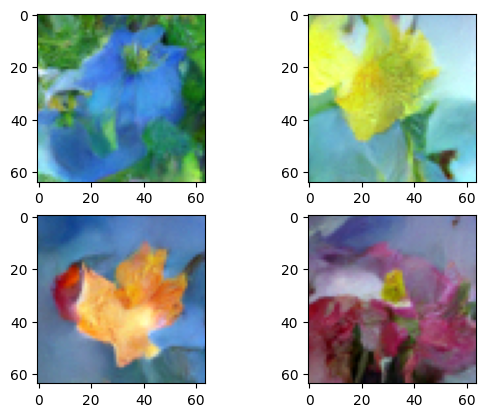

EPOCH = 14 / 64 LOSS = : 0.04232373984688975


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.88it/s]
499it [00:20, 23.83it/s]


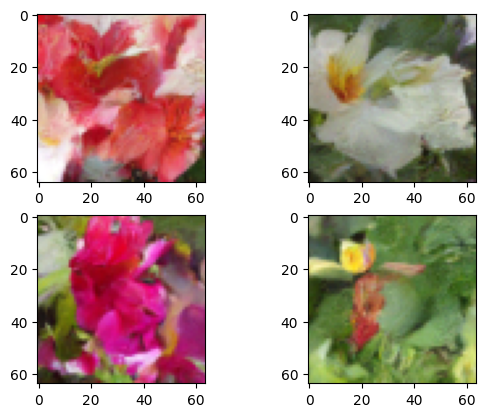

EPOCH = 15 / 64 LOSS = : 0.04016997328415906


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.90it/s]
499it [00:21, 23.72it/s]


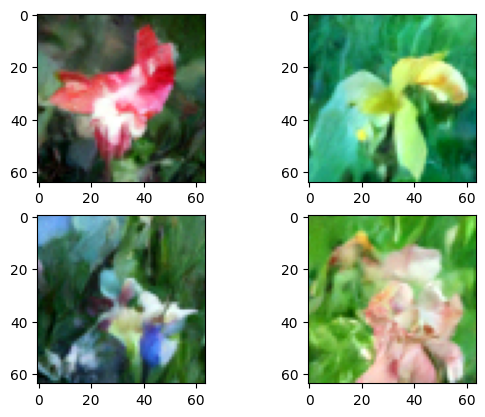

EPOCH = 16 / 64 LOSS = : 0.039911651425336724


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.57it/s]


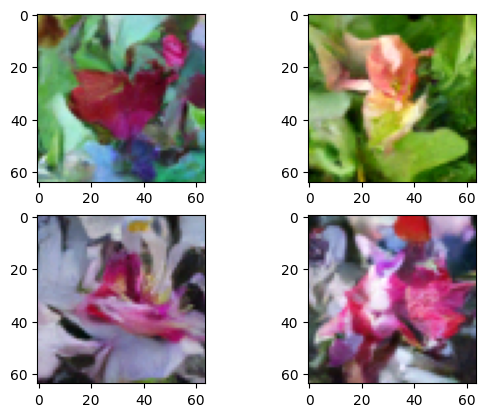

EPOCH = 17 / 64 LOSS = : 0.041576385825785024


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.66it/s]


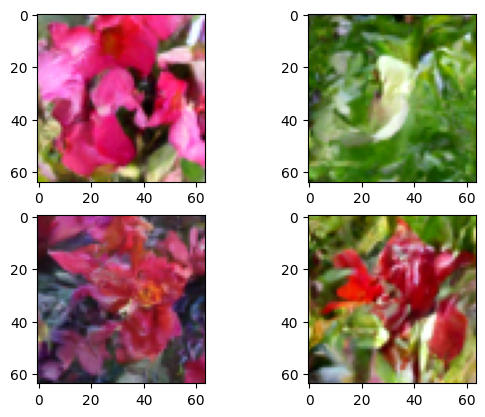

EPOCH = 18 / 64 LOSS = : 0.04030218321073505


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.88it/s]
499it [00:21, 23.63it/s]


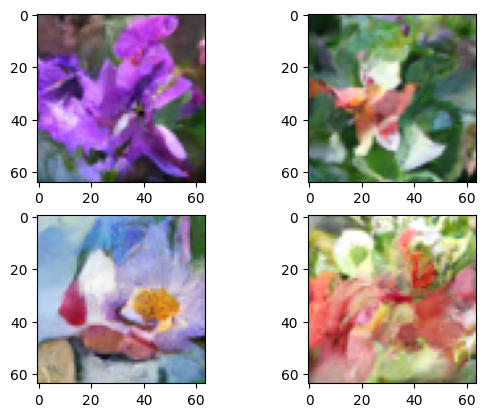

EPOCH = 19 / 64 LOSS = : 0.040360838207593765


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.87it/s]
499it [00:21, 23.28it/s]


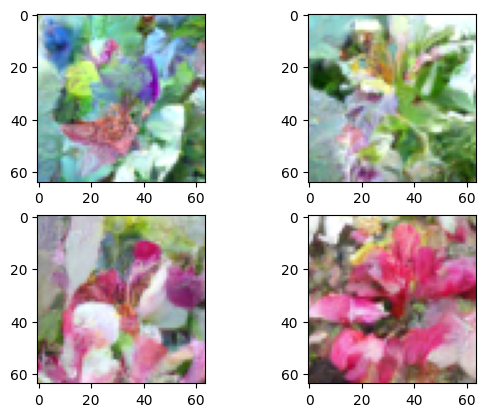

EPOCH = 20 / 64 LOSS = : 0.04005865867132228


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.71it/s]


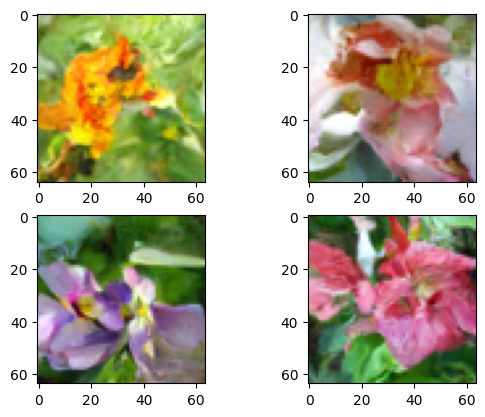

EPOCH = 21 / 64 LOSS = : 0.03986380551600299


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.59it/s]


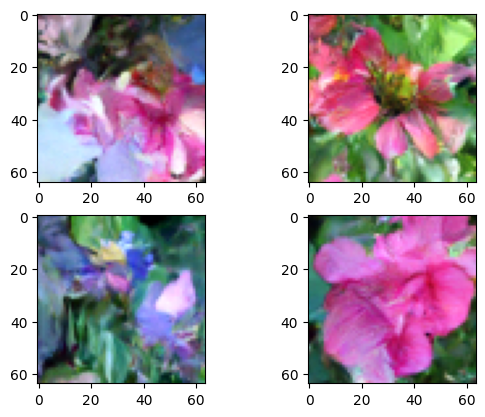

EPOCH = 22 / 64 LOSS = : 0.04061147677944291


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.75it/s]


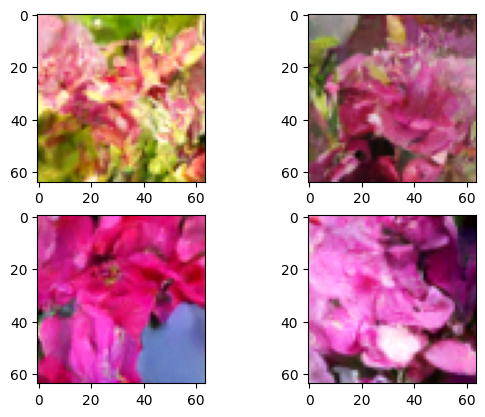

EPOCH = 23 / 64 LOSS = : 0.04008809491565937


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:19<00:00,  4.89it/s]
499it [00:21, 23.30it/s]


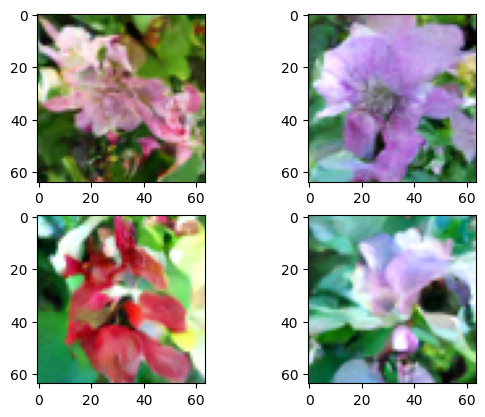

EPOCH = 24 / 64 LOSS = : 0.0399974074243374


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.87it/s]
499it [00:21, 23.00it/s]


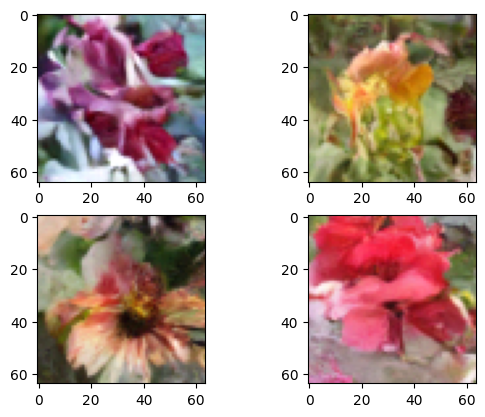

EPOCH = 25 / 64 LOSS = : 0.04029185997316739


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:21<00:00,  4.82it/s]
499it [00:21, 22.97it/s]


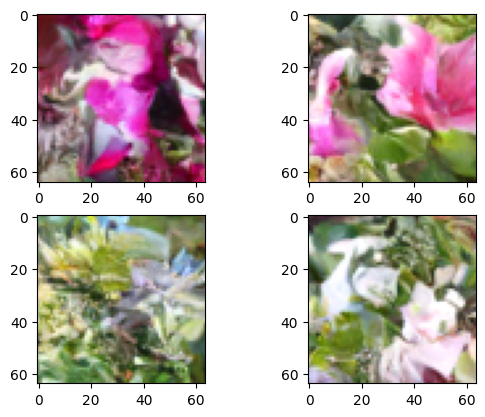

EPOCH = 26 / 64 LOSS = : 0.04045463536587432


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.86it/s]
499it [00:21, 23.02it/s]


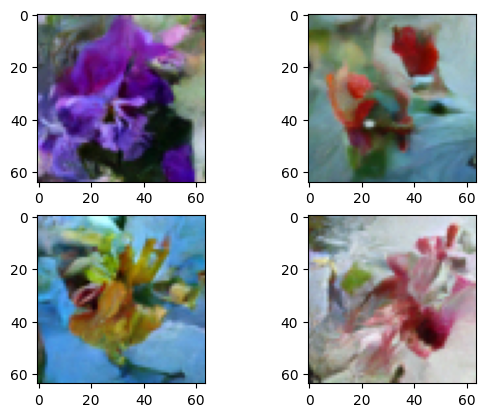

EPOCH = 27 / 64 LOSS = : 0.04153252098384338


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.85it/s]
499it [00:21, 22.97it/s]


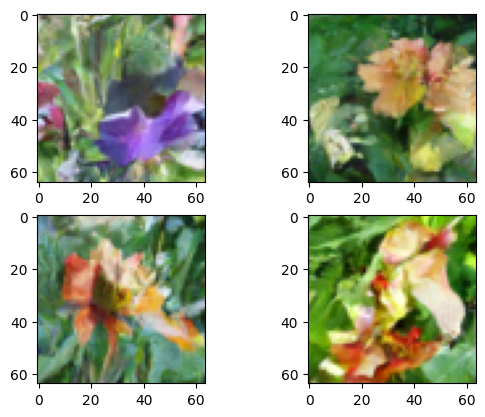

EPOCH = 28 / 64 LOSS = : 0.03986964694257072


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:21<00:00,  4.83it/s]
499it [00:21, 22.92it/s]


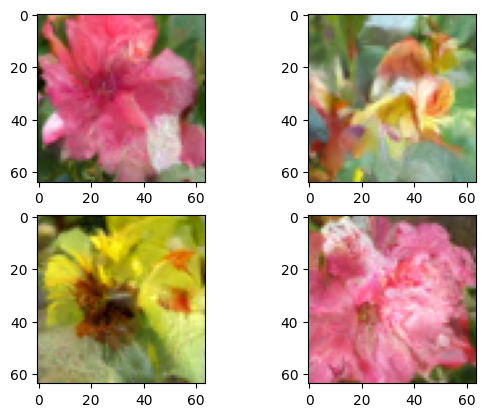

EPOCH = 29 / 64 LOSS = : 0.04184521007408931


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:21<00:00,  4.81it/s]
499it [00:21, 22.98it/s]


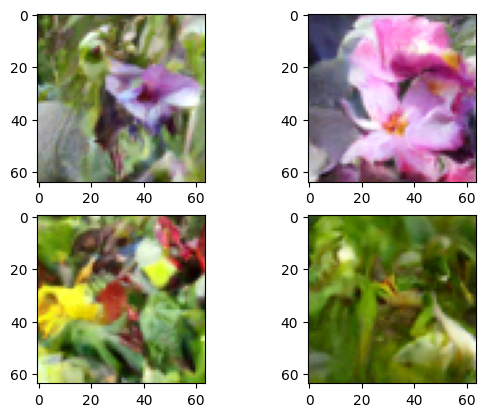

EPOCH = 30 / 64 LOSS = : 0.0393063483726987


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:21<00:00,  4.81it/s]
499it [00:21, 23.05it/s]


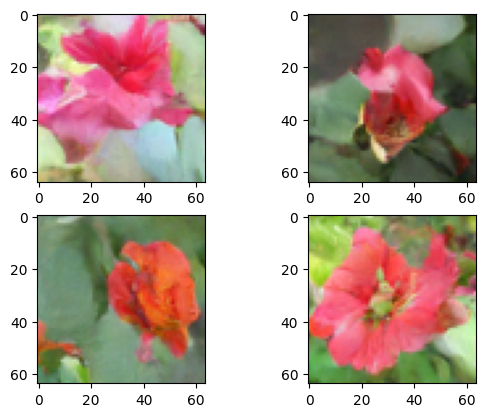

EPOCH = 31 / 64 LOSS = : 0.04084586877037178


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:22<00:00,  4.78it/s]
499it [00:22, 22.37it/s]


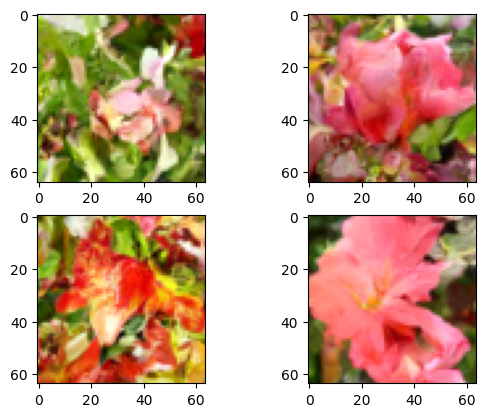

EPOCH = 32 / 64 LOSS = : 0.04191146053570457


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.86it/s]
499it [00:21, 23.03it/s]


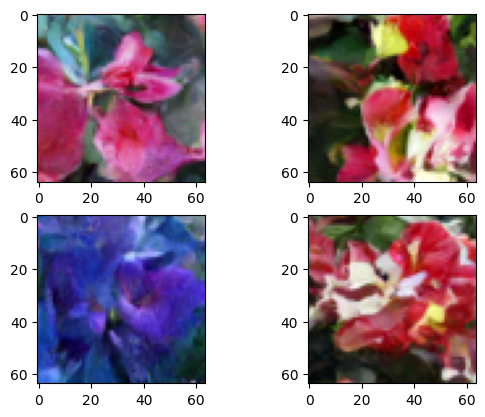

EPOCH = 33 / 64 LOSS = : 0.03996875779047783


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.86it/s]
499it [00:21, 23.02it/s]


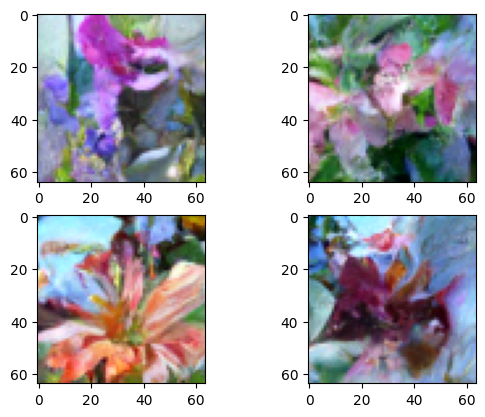

EPOCH = 34 / 64 LOSS = : 0.0405155180699446


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.85it/s]
499it [00:21, 22.95it/s]


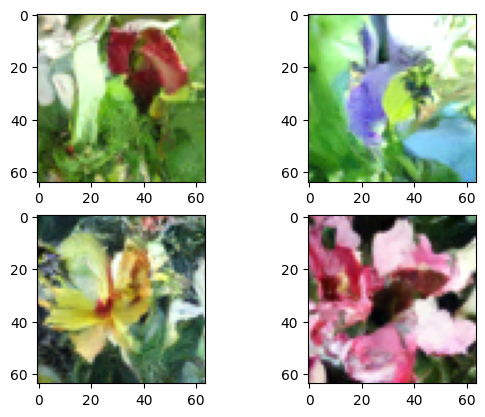

EPOCH = 35 / 64 LOSS = : 0.04114522806114771


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.85it/s]
499it [00:21, 23.05it/s]


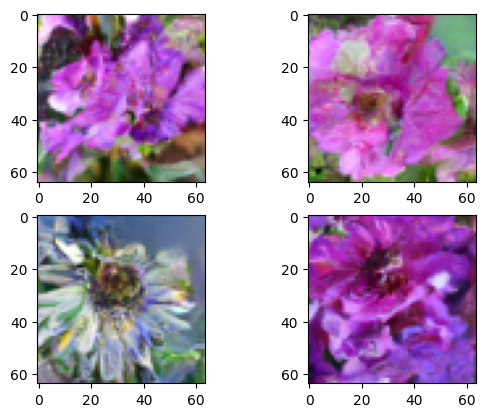

EPOCH = 36 / 64 LOSS = : 0.04034458037433037


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.86it/s]
499it [00:21, 23.00it/s]


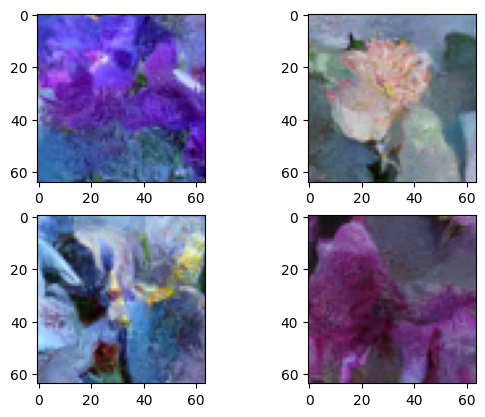

EPOCH = 37 / 64 LOSS = : 0.040111182947148764


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:20<00:00,  4.87it/s]
499it [00:21, 23.01it/s]


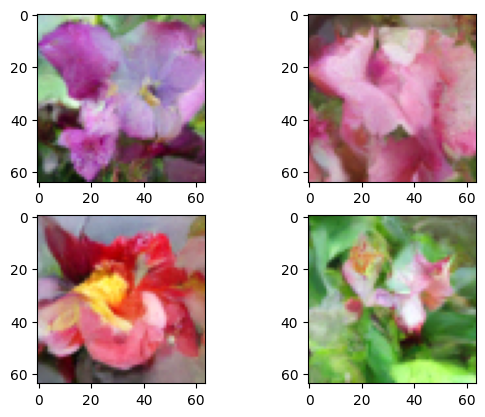

EPOCH = 38 / 64 LOSS = : 0.03878441447039788


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [04:27<00:00,  2.55it/s]
499it [00:22, 22.28it/s]


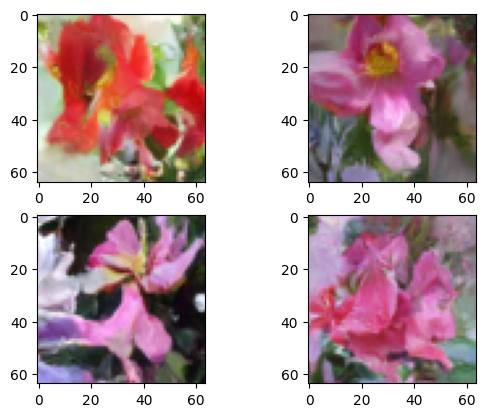

EPOCH = 39 / 64 LOSS = : 0.04172499843974136


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:47<00:00,  4.08it/s]
499it [00:22, 22.61it/s]


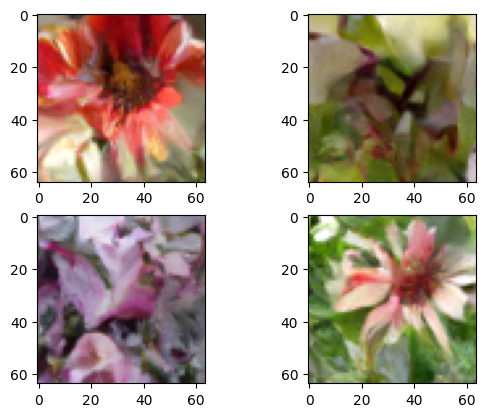

EPOCH = 40 / 64 LOSS = : 0.04012935774747686


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:43<00:00,  4.17it/s]
499it [00:21, 22.72it/s]


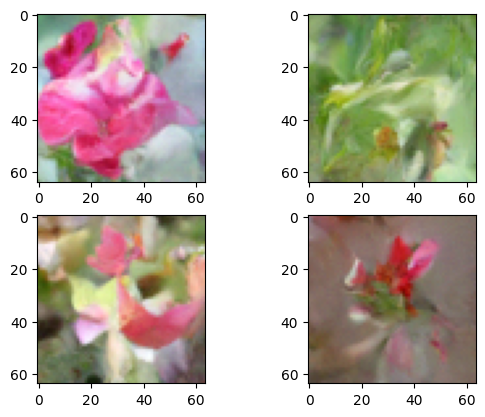

EPOCH = 41 / 64 LOSS = : 0.04145949528091027


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:42<00:00,  4.21it/s]
499it [00:21, 22.84it/s]


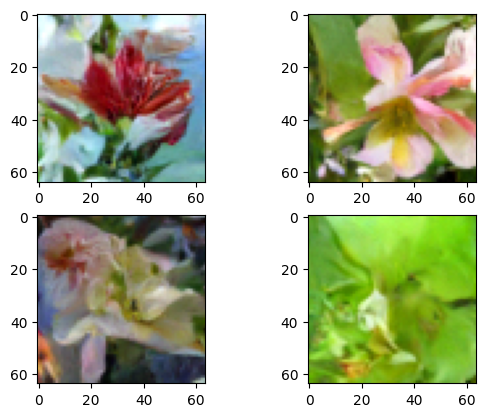

EPOCH = 42 / 64 LOSS = : 0.04060081009482665


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:31<00:00,  4.49it/s]
499it [00:18, 26.53it/s]


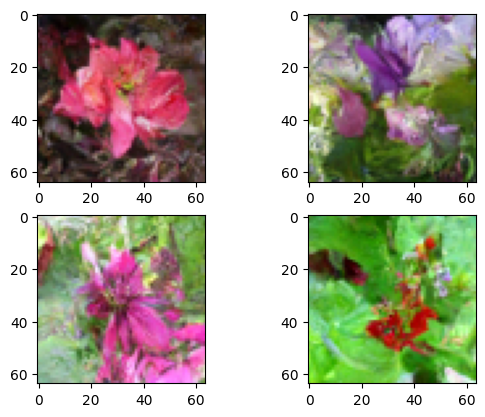

EPOCH = 43 / 64 LOSS = : 0.040266027188616806


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:12<00:00,  5.14it/s]
499it [00:19, 25.86it/s]


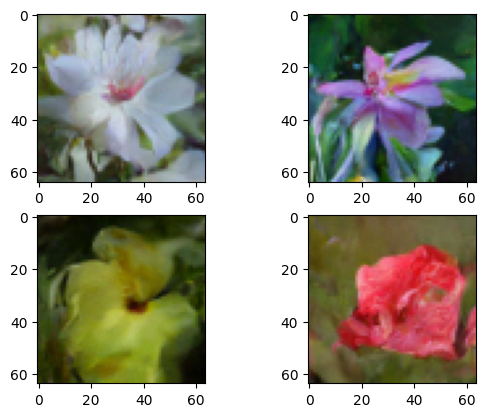

EPOCH = 44 / 64 LOSS = : 0.040363645299864914


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:14<00:00,  5.09it/s]
499it [00:20, 24.39it/s]


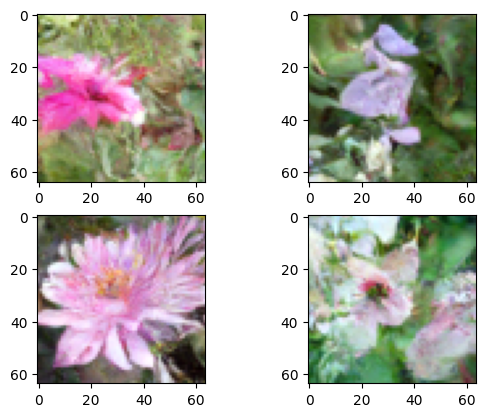

EPOCH = 45 / 64 LOSS = : 0.040369616292247716


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:14<00:00,  5.07it/s]
499it [00:20, 24.90it/s]


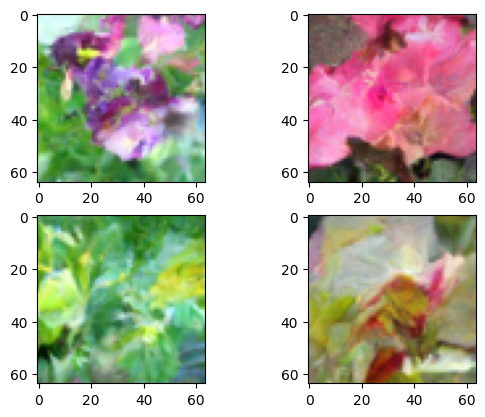

EPOCH = 46 / 64 LOSS = : 0.041011679977659254


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.10it/s]
499it [00:19, 25.05it/s]


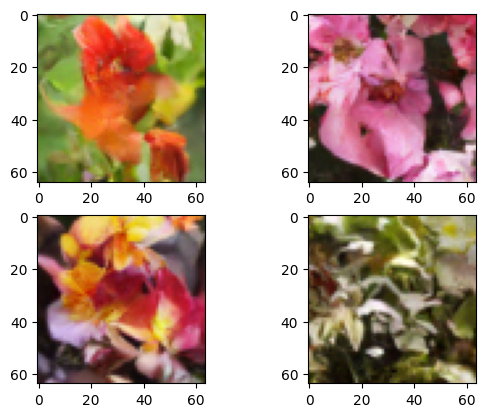

EPOCH = 47 / 64 LOSS = : 0.040140325608431116


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:16<00:00,  5.01it/s]
499it [00:20, 24.69it/s]


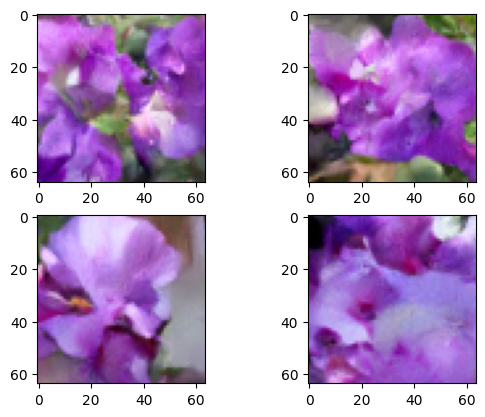

EPOCH = 48 / 64 LOSS = : 0.04006010494973303


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.10it/s]
499it [00:19, 25.11it/s]


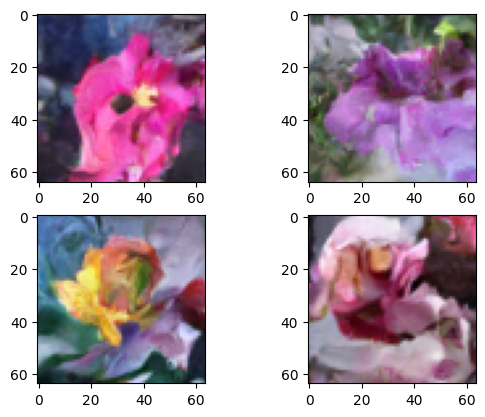

EPOCH = 49 / 64 LOSS = : 0.04072757928681361


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.09it/s]
499it [00:19, 25.09it/s]


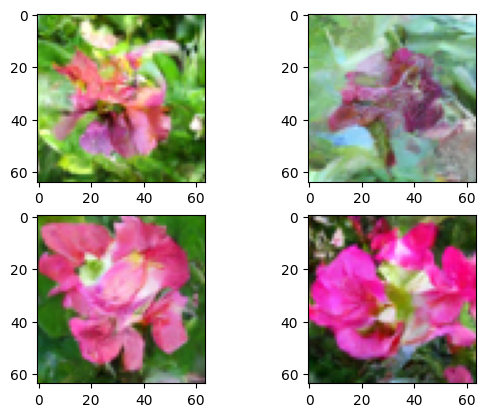

EPOCH = 50 / 64 LOSS = : 0.040739480018905226


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.11it/s]
499it [00:19, 25.11it/s]


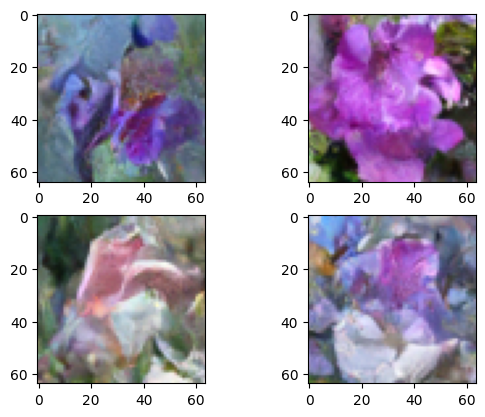

EPOCH = 51 / 64 LOSS = : 0.041460831024167824


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.10it/s]
499it [00:19, 25.27it/s]


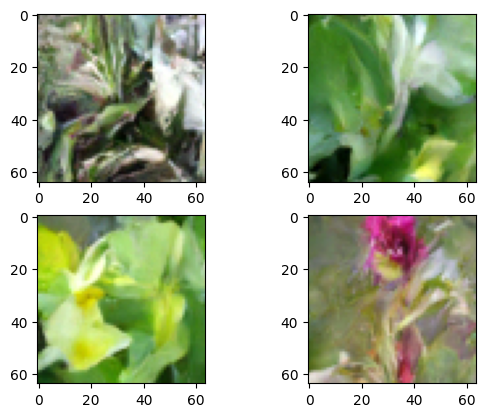

EPOCH = 52 / 64 LOSS = : 0.03960659612199603


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:14<00:00,  5.09it/s]
499it [00:19, 25.17it/s]


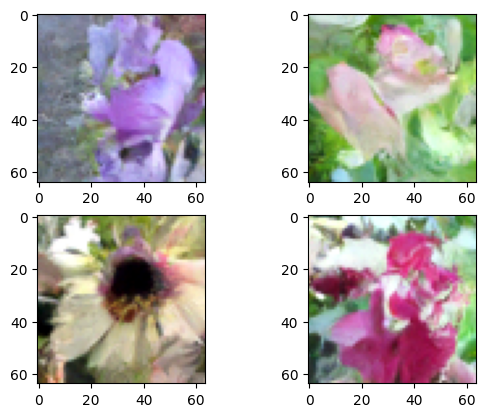

EPOCH = 53 / 64 LOSS = : 0.039786957586703066


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.10it/s]
499it [00:19, 25.36it/s]


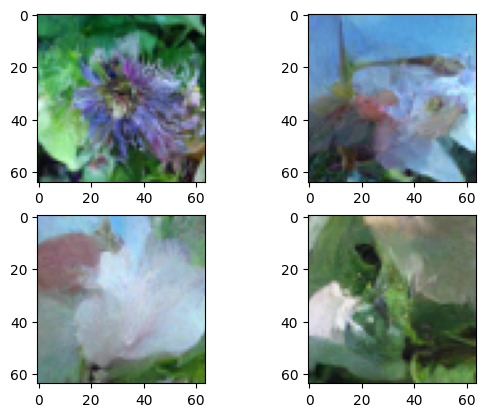

EPOCH = 54 / 64 LOSS = : 0.038884145871372865


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.10it/s]
499it [00:19, 25.30it/s]


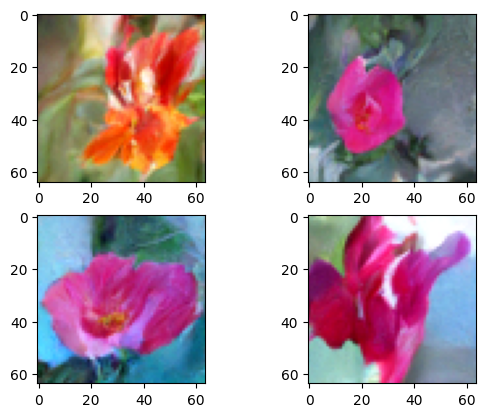

EPOCH = 55 / 64 LOSS = : 0.03979479444835914


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.11it/s]
499it [00:19, 25.29it/s]


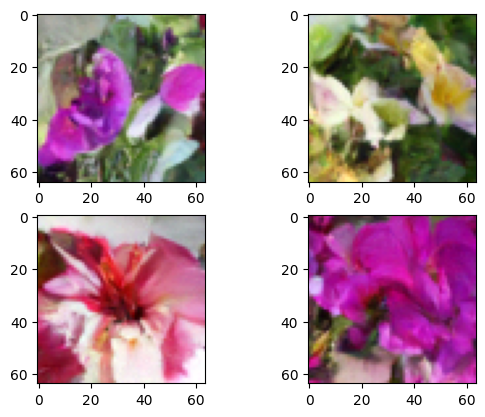

EPOCH = 56 / 64 LOSS = : 0.03968075902987807


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.42it/s]


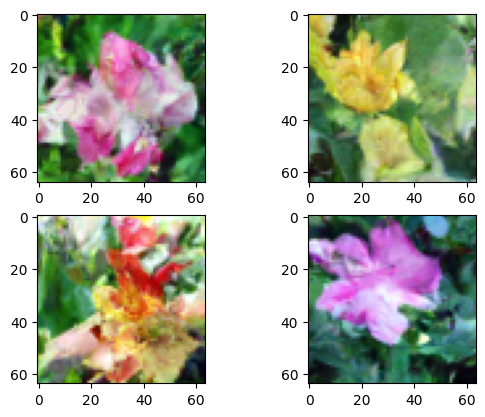

EPOCH = 57 / 64 LOSS = : 0.04010529034358622


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.55it/s]


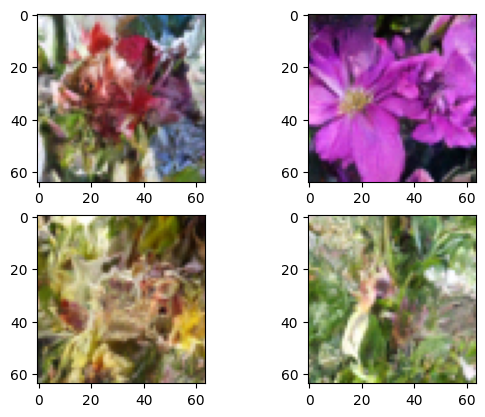

EPOCH = 58 / 64 LOSS = : 0.03976906164101383


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.60it/s]


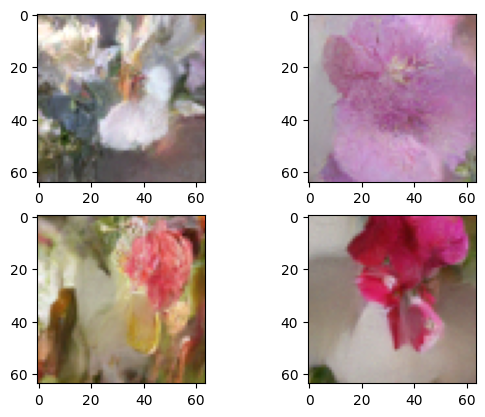

EPOCH = 59 / 64 LOSS = : 0.03961970604467274


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.11it/s]
499it [00:19, 25.70it/s]


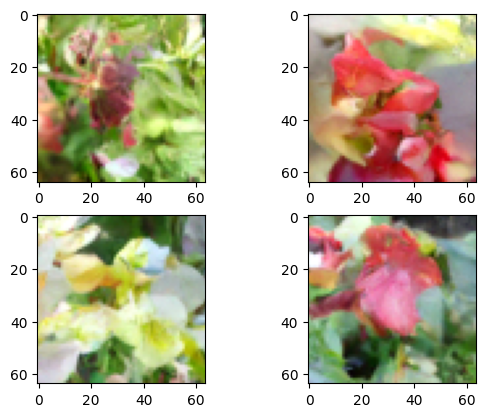

EPOCH = 60 / 64 LOSS = : 0.04031876528695706


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.63it/s]


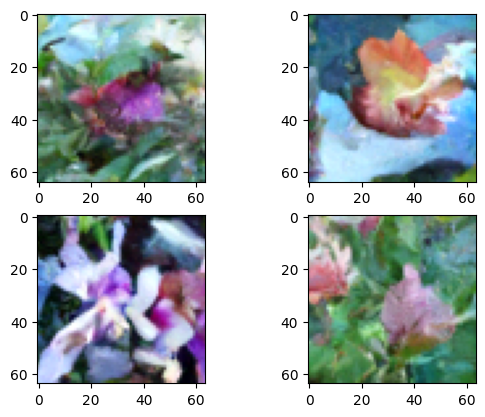

EPOCH = 61 / 64 LOSS = : 0.04149867651323157


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.58it/s]


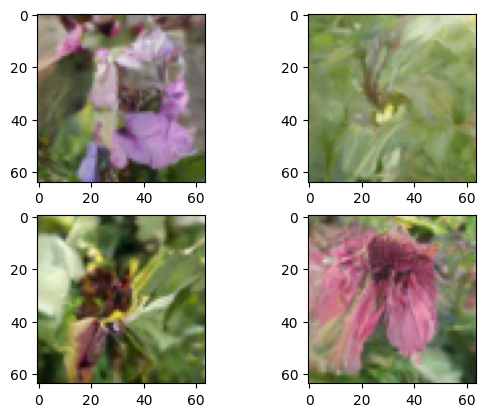

EPOCH = 62 / 64 LOSS = : 0.03943247689942002


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.12it/s]
499it [00:19, 25.26it/s]


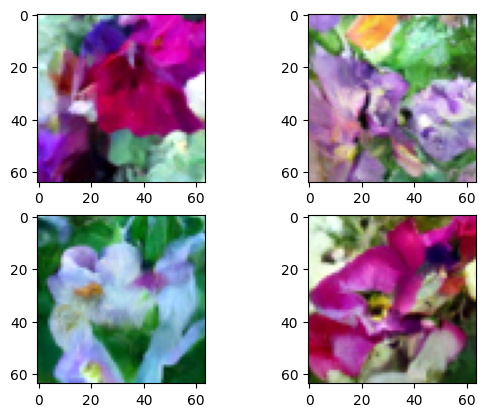

EPOCH = 63 / 64 LOSS = : 0.03994954728775404


100%|████████████████████████████████████████████████████████████████████████████████| 682/682 [02:13<00:00,  5.09it/s]
499it [00:20, 24.50it/s]


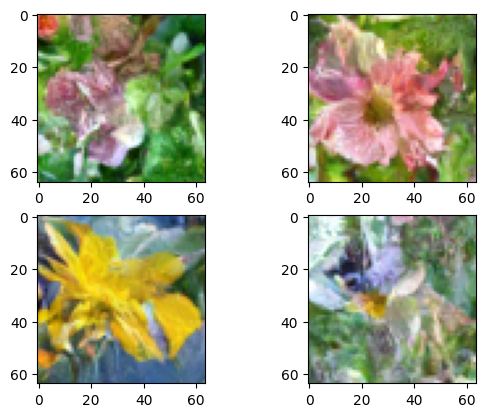

EPOCH = 64 / 64 LOSS = : 0.03915357388162718


In [25]:
train(args)

499it [00:19, 26.12it/s]


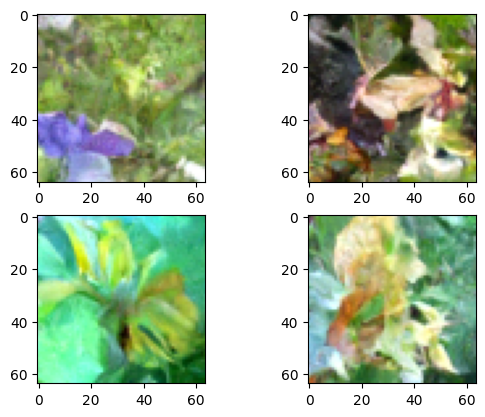

In [50]:
diffusion = Diffusion(image_size=args.image_size, device = args.device)
desc = input("ENTER DESCRIPTION: ")
sample_text = [desc]
sampled_images = diffusion.generate_samples(model, text = sample_text, n=len(sample_text))

In [34]:
torch.save(model.state_dict(), "conditional_diffusion_64.pth")